# Optimized Part II Vision Task — CNN Image Classification

This notebook is built to match the final assessment guideline while training faster on an RTX 3050 / laptop GPU.

It includes:
- Dataset analysis and visualization
- Baseline CNN from scratch: 3 convolution + pooling layers and 3 fully connected layers
- Deeper CNN with Batch Normalization and Dropout
- Adam vs SGD optimizer comparison
- Ablation study by removing Dropout
- Transfer learning with MobileNetV2
- Accuracy, precision, recall, F1-score, confusion matrix, and sample predictions

Recommended hyperparameters used here:
- `IMG_SIZE = (128, 128)`
- `BATCH_SIZE = 32`
- `EPOCHS_BASELINE = 10`
- `EPOCHS_DEEPER = 15`

In [1]:
from pathlib import Path
import time, random, itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score

print("TensorFlow:", tf.__version__)
print("GPU:", tf.config.list_physical_devices("GPU"))

for gpu in tf.config.list_physical_devices("GPU"):
    try:
        tf.config.experimental.set_memory_growth(gpu, True)
    except Exception as e:
        print("Memory growth skipped:", e)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

TensorFlow: 2.10.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
# Change this path only if your dataset location is different.
DATA_DIR = Path("C:/Users/npary/OneDrive/Desktop/ai/final_processed_dataset_ai_assignment/Fdataset")

SPLITS = ["train", "val", "test"]
IMG_SIZE = (128, 128)
BATCH_SIZE = 32
EPOCHS_BASELINE = 10
EPOCHS_DEEPER = 15
EPOCHS_TRANSFER = 8

CLASS_NAMES = sorted([d.name for d in (DATA_DIR / "train").iterdir() if d.is_dir()])
NUM_CLASSES = len(CLASS_NAMES)

print(f"Classes ({NUM_CLASSES}):", CLASS_NAMES)
print("Image size:", IMG_SIZE)
print("Batch size:", BATCH_SIZE)

Classes (10): ['butterfly', 'cat', 'chicken', 'cow', 'dog', 'elephant', 'horse', 'sheep', 'spider', 'squirrel']
Image size: (128, 128)
Batch size: 32


In [3]:
def count_images_by_split(data_dir, splits, class_names):
    rows = []
    exts = [".jpg", ".jpeg", ".png", ".bmp", ".webp"]
    for split in splits:
        for cls in class_names:
            folder = data_dir / split / cls
            count = len([p for p in folder.glob("*") if p.suffix.lower() in exts])
            rows.append({"split": split, "class": cls, "count": count})
    return pd.DataFrame(rows)

count_df = count_images_by_split(DATA_DIR, SPLITS, CLASS_NAMES)
display(count_df)
print("Total images:", count_df["count"].sum())
print(count_df.groupby("split")["count"].sum())

,split,class,count
0,train,butterfly,1000
1,train,cat,1000
2,train,chicken,1000
3,train,cow,1000
4,train,dog,1000
5,train,elephant,1000
6,train,horse,1000
7,train,sheep,1000
8,train,spider,1000
9,train,squirrel,1000


Total images: 14000
split
test      2000
train    10000
val       2000
Name: count, dtype: int64


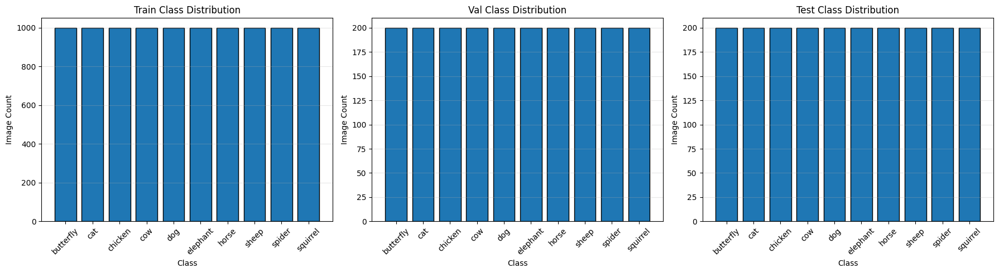

In [4]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, split in zip(axes, SPLITS):
    sub = count_df[count_df["split"] == split]
    ax.bar(sub["class"], sub["count"], edgecolor="black")
    ax.set_title(f"{split.capitalize()} Class Distribution")
    ax.set_xlabel("Class")
    ax.set_ylabel("Image Count")
    ax.tick_params(axis="x", rotation=45)
    ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig("class_distribution.png", dpi=150, bbox_inches="tight")
plt.show()

In [5]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.05,
    horizontal_flip=True
)
val_test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    DATA_DIR / "train",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True,
    seed=SEED
)

val_gen = val_test_datagen.flow_from_directory(
    DATA_DIR / "val",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

test_gen = val_test_datagen.flow_from_directory(
    DATA_DIR / "test",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

print("Generator image shape:", train_gen.image_shape)

Found 10000 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Generator image shape: (128, 128, 3)


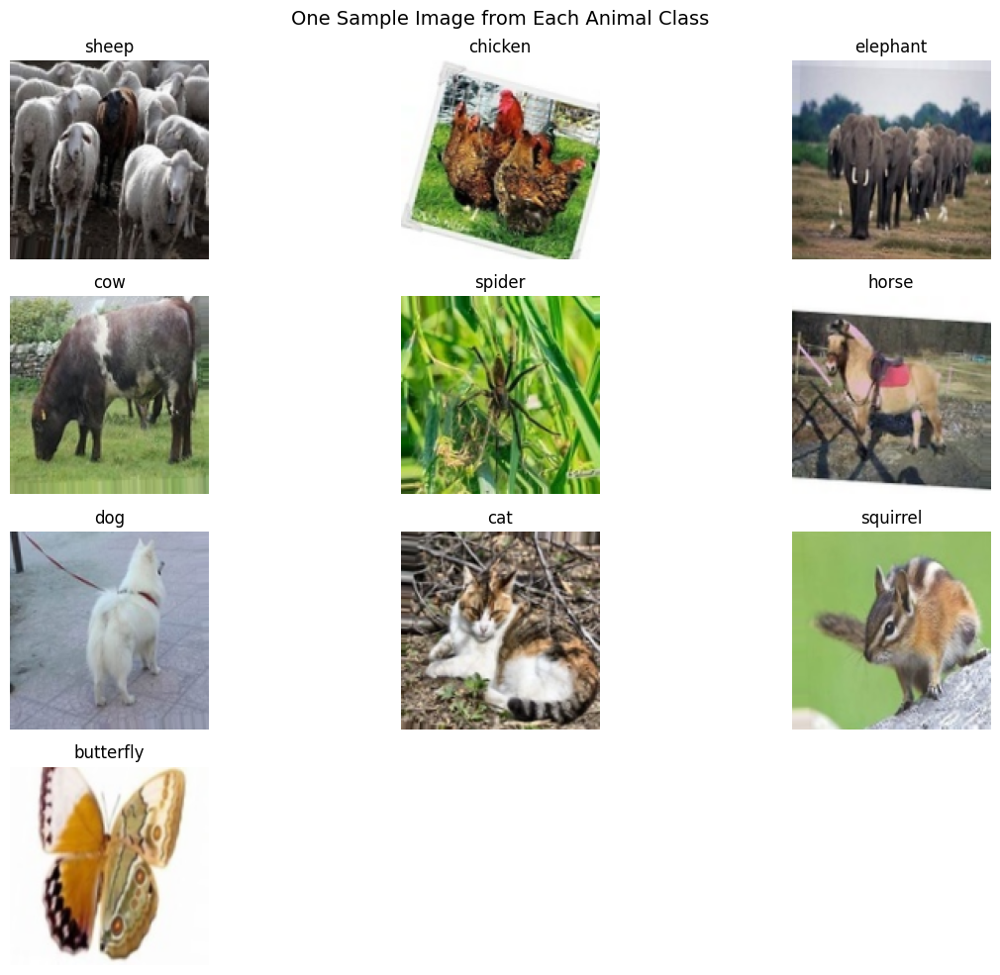

In [32]:
# ── Grid of one image from each class ────────────────────────────────────

plt.figure(figsize=(12, 10))

shown_classes = set()
plot_index = 1

train_gen.reset()

for images, labels in train_gen:
    for i in range(len(images)):
        class_idx = np.argmax(labels[i])
        class_name = CLASS_NAMES[class_idx]

        if class_name not in shown_classes:
            plt.subplot(4, 3, plot_index)
            plt.imshow(images[i])
            plt.title(class_name)
            plt.axis("off")

            shown_classes.add(class_name)
            plot_index += 1

        if len(shown_classes) == NUM_CLASSES:
            break

    if len(shown_classes) == NUM_CLASSES:
        break

plt.suptitle("One Sample Image from Each Animal Class", fontsize=14)
plt.tight_layout()
plt.savefig("one_image_per_class.png", dpi=150, bbox_inches="tight")
plt.show()

train_gen.reset()

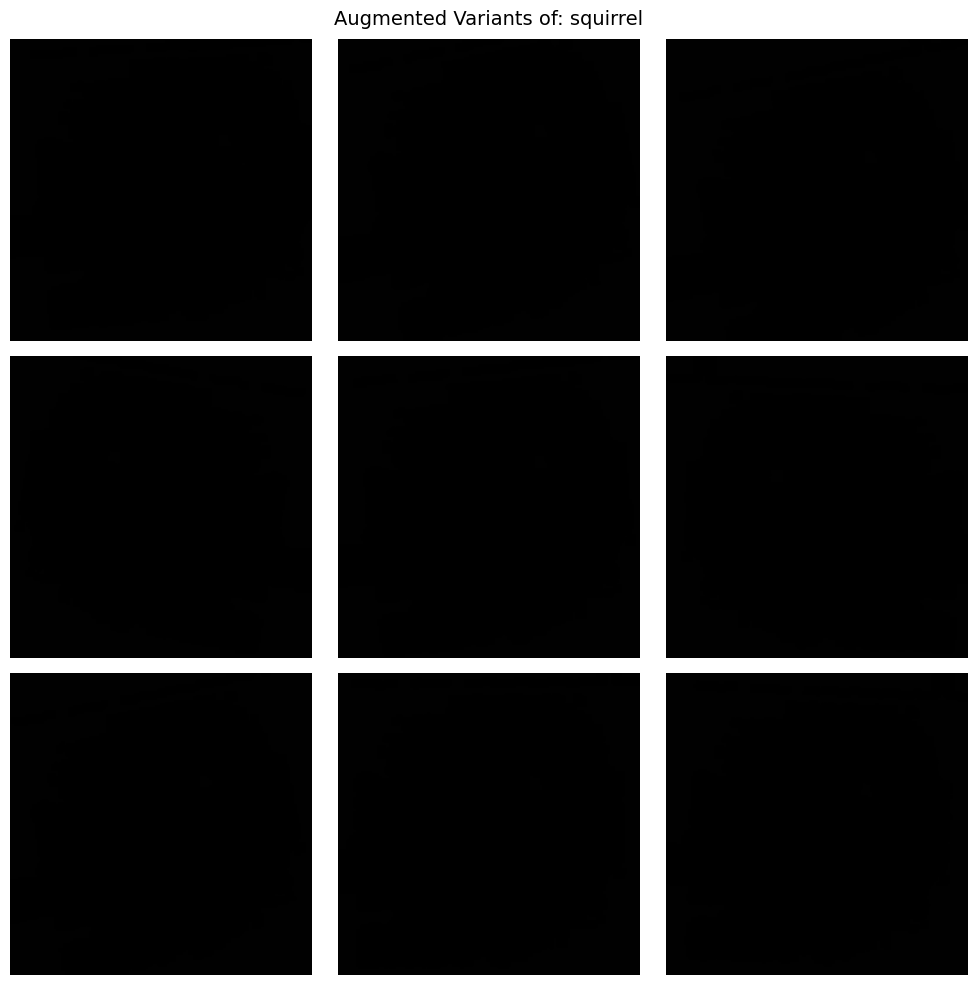

In [34]:
# ── 9 augmented versions of a single image ───────────────────────────────

sample_image, sample_label = next(train_gen)

single_image = sample_image[0]
single_label = CLASS_NAMES[np.argmax(sample_label[0])]

single_image = np.expand_dims(single_image, axis=0)

plt.figure(figsize=(10, 10))

aug_iter = train_datagen.flow(
    single_image,
    batch_size=1
)

for i in range(9):
    aug_image = next(aug_iter)[0]

    plt.subplot(3, 3, i + 1)
    plt.imshow(np.clip(aug_image, 0, 1))
    plt.axis("off")

plt.suptitle(f"Augmented Variants of: {single_label}", fontsize=14)
plt.tight_layout()
plt.savefig("augmented_single_class.png", dpi=150, bbox_inches="tight")
plt.show()

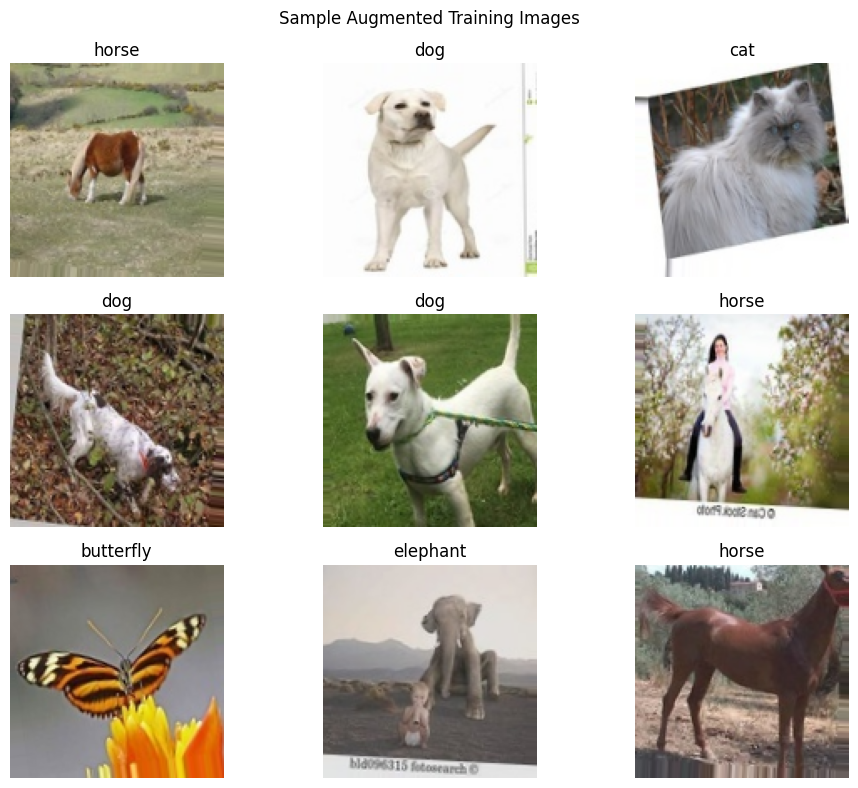

In [6]:
images, labels = next(train_gen)
plt.figure(figsize=(10, 8))
for i in range(min(9, len(images))):
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.title(CLASS_NAMES[np.argmax(labels[i])])
    plt.axis("off")
plt.suptitle("Sample Augmented Training Images")
plt.tight_layout()
plt.savefig("sample_augmented_images.png", dpi=150, bbox_inches="tight")
plt.show()
train_gen.reset()

In [25]:
def plot_history(history, title, filename_prefix):
    hist = history.history
    epochs = range(1, len(hist["loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist["loss"], label="Training Loss")
    plt.plot(epochs, hist["val_loss"], label="Validation Loss")
    plt.title(title + " - Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(filename_prefix + "_loss.png", dpi=150, bbox_inches="tight")
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist["accuracy"], label="Training Accuracy")
    plt.plot(epochs, hist["val_accuracy"], label="Validation Accuracy")
    plt.title(title + " - Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(filename_prefix + "_accuracy.png", dpi=150, bbox_inches="tight")
    plt.show()


def evaluate_model(model, generator, model_name):
    generator.reset()
    loss, acc = model.evaluate(generator, verbose=0)
    generator.reset()
    probs = model.predict(generator, verbose=0)
    y_pred = np.argmax(probs, axis=1)
    y_true = generator.classes

    precision = precision_score(y_true, y_pred, average="weighted", zero_division=0)
    recall = recall_score(y_true, y_pred, average="weighted", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="weighted", zero_division=0)

    print("\n" + model_name + " Results")
    print(f"Test Loss     : {loss:.4f}")
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {precision:.4f}")
    print(f"Recall        : {recall:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=CLASS_NAMES, zero_division=0))

    return {"model": model_name, "loss": loss, "accuracy": acc, "precision": precision,
            "recall": recall, "f1": f1, "y_true": y_true, "y_pred": y_pred}


def plot_confusion_matrix(y_true, y_pred, title, filename):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation="nearest")
    plt.title(title)
    plt.colorbar()
    ticks = np.arange(len(CLASS_NAMES))
    plt.xticks(ticks, CLASS_NAMES, rotation=45, ha="right")
    plt.yticks(ticks, CLASS_NAMES)

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center")

    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")
    plt.tight_layout()
    plt.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()

def plot_sample_predictions(model, generator, class_names, n=9):
    generator.reset()

    images, labels = next(generator)
    probs = model.predict(images, verbose=0)
    preds = np.argmax(probs, axis=1)
    true_labels = np.argmax(labels, axis=1)

    plt.figure(figsize=(12, 12))

    for i in range(min(n, len(images))):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.axis("off")

        actual = class_names[true_labels[i]]
        predicted = class_names[preds[i]]
        confidence = np.max(probs[i])

        plt.title(
            f"Actual: {actual}\nPredicted: {predicted}\nConf: {confidence:.2f}",
            fontsize=9
        )

    plt.tight_layout()
    plt.show()

## 2. Baseline CNN

Requirement covered: three convolutional layers, each followed by pooling, then three fully connected layers and an output layer.

In [8]:
def build_baseline_cnn(input_shape=(128,128,3), num_classes=NUM_CLASSES):
    model = models.Sequential(name="baseline_cnn")

    model.add(layers.Conv2D(32, (3,3), activation="relu", padding="same", input_shape=input_shape))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(256, activation="relu"))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(128, activation="relu"))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(64, activation="relu"))
    model.add(layers.Dense(num_classes, activation="softmax"))

    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3),
                  loss="categorical_crossentropy", metrics=["accuracy"])
    return model

baseline_model = build_baseline_cnn((128,128,3), NUM_CLASSES)
baseline_model.summary()
print("Model input shape:", baseline_model.input_shape)

Model: "baseline_cnn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 128)     

In [9]:
cb_baseline = [
    callbacks.EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=2, verbose=1),
    callbacks.ModelCheckpoint("best_baseline.keras", monitor="val_accuracy", save_best_only=True, verbose=0)
]

t0 = time.time()
history_baseline = baseline_model.fit(train_gen, epochs=EPOCHS_BASELINE,
                                      validation_data=val_gen, callbacks=cb_baseline, verbose=1)
baseline_time = time.time() - t0
print(f"Baseline training time: {baseline_time/60:.2f} minutes")

Epoch 1/10
313/313 [==============================] - 93s 261ms/step - loss: 2.2508 - accuracy: 0.1494 - val_loss: 2.0830 - val_accuracy: 0.2400 - lr: 0.0010
Epoch 2/10
313/313 [==============================] - 79s 251ms/step - loss: 2.0380 - accuracy: 0.2579 - val_loss: 1.8734 - val_accuracy: 0.3130 - lr: 0.0010
Epoch 3/10
313/313 [==============================] - 78s 250ms/step - loss: 1.8644 - accuracy: 0.3270 - val_loss: 1.7725 - val_accuracy: 0.3565 - lr: 0.0010
Epoch 4/10
313/313 [==============================] - 80s 255ms/step - loss: 1.7659 - accuracy: 0.3594 - val_loss: 1.6186 - val_accuracy: 0.4360 - lr: 0.0010
Epoch 5/10
313/313 [==============================] - 80s 256ms/step - loss: 1.6537 - accuracy: 0.4110 - val_loss: 1.5468 - val_accuracy: 0.4505 - lr: 0.0010
Epoch 6/10
313/313 [==============================] - 84s 267ms/step - loss: 1.5763 - accuracy: 0.4409 - val_loss: 1.5104 - val_accuracy: 0.4735 - lr: 0.0010
Epoch 7/10
313/313 [==============================] 

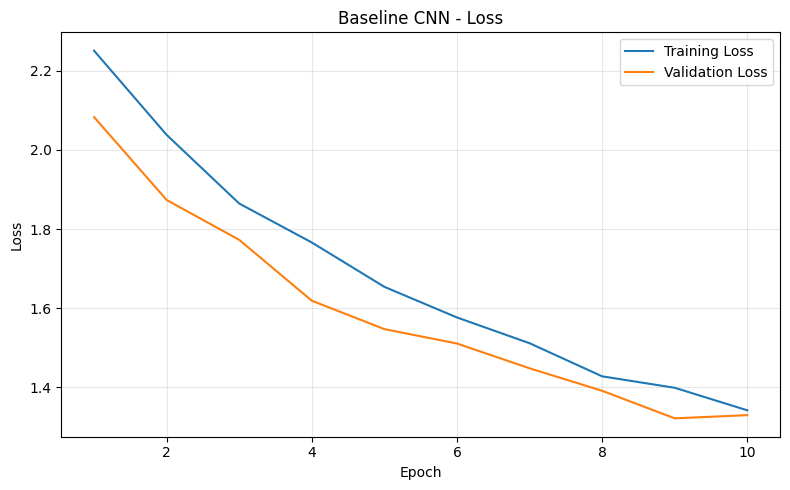

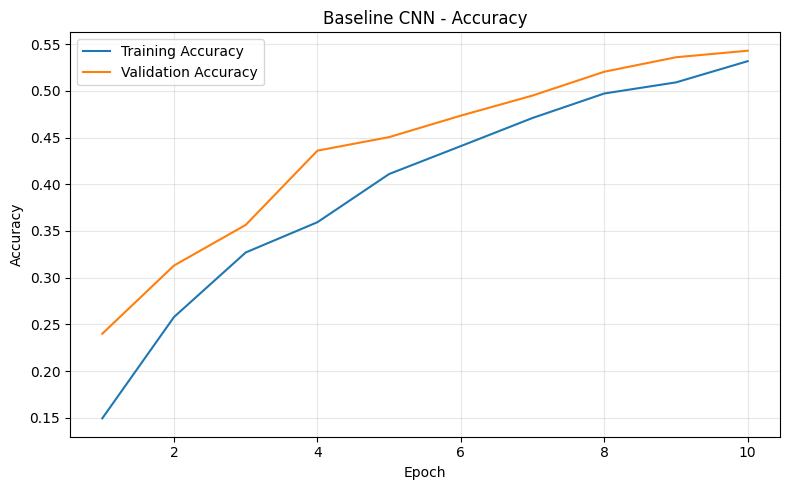


Baseline CNN Results
Test Loss     : 1.3121
Test Accuracy : 0.5295
Precision     : 0.5493
Recall        : 0.5295
F1 Score      : 0.5273

Classification Report:
              precision    recall  f1-score   support

   butterfly       0.60      0.79      0.68       200
         cat       0.50      0.43      0.46       200
     chicken       0.81      0.48      0.61       200
         cow       0.37      0.50      0.42       200
         dog       0.48      0.29      0.36       200
    elephant       0.60      0.62      0.61       200
       horse       0.53      0.41      0.46       200
       sheep       0.45      0.45      0.45       200
      spider       0.75      0.68      0.71       200
    squirrel       0.42      0.64      0.51       200

    accuracy                           0.53      2000
   macro avg       0.55      0.53      0.53      2000
weighted avg       0.55      0.53      0.53      2000



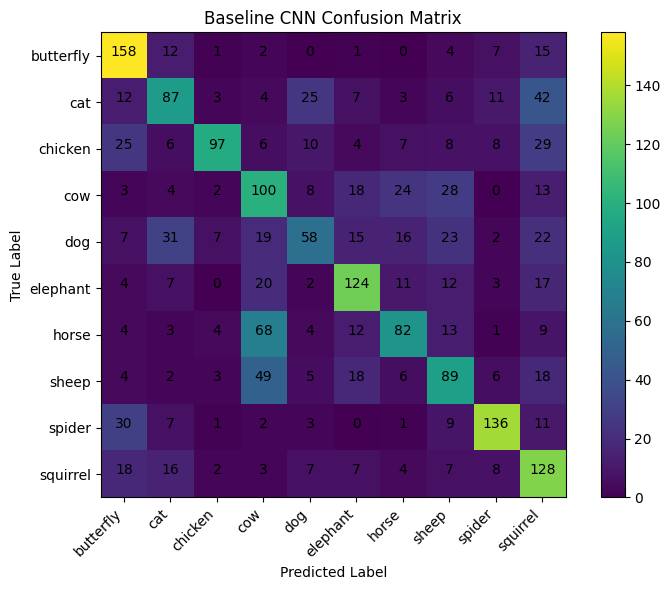

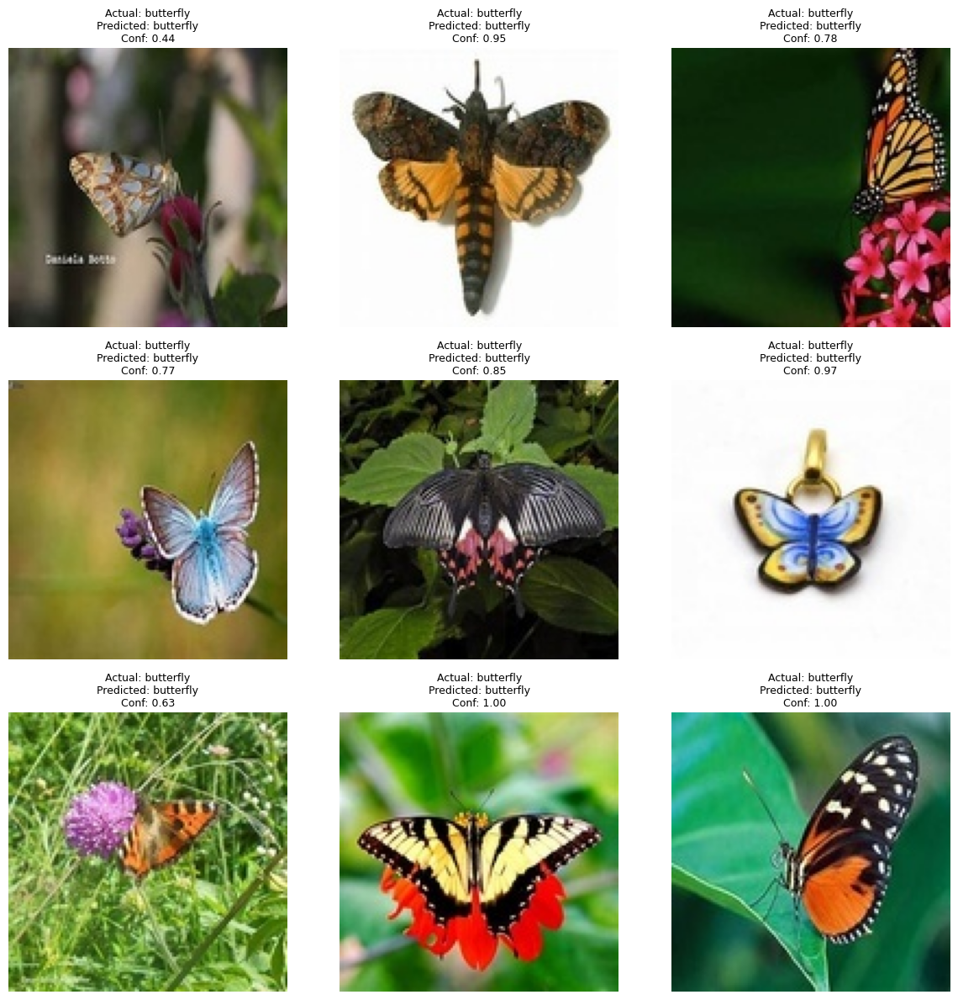

In [26]:
plot_history(history_baseline, "Baseline CNN", "baseline")
res_baseline = evaluate_model(baseline_model, test_gen, "Baseline CNN")
plot_confusion_matrix(res_baseline["y_true"], res_baseline["y_pred"],
                      "Baseline CNN Confusion Matrix", "baseline_confusion_matrix.png")
acc_b = res_baseline["accuracy"]

plot_sample_predictions(
    baseline_model,
    test_gen,
    CLASS_NAMES,
    n=9
)

## 3. Deeper CNN with Regularization

This model doubles the convolutional layers compared with the baseline and uses Batch Normalization and Dropout. GlobalAveragePooling2D keeps the model lightweight and avoids GPU memory exhaustion.

In [11]:
def build_deeper_cnn(optimizer="adam", input_shape=(128,128,3), num_classes=NUM_CLASSES):
    model = models.Sequential(name=f"deeper_cnn_{optimizer}")

    l2_reg = keras.regularizers.l2(1e-4)

    for block_filters, drop in [(32, 0.20), (64, 0.25), (128, 0.30)]:
        if len(model.layers) == 0:
            model.add(layers.Conv2D(block_filters, (3,3), padding="same",
                                    input_shape=input_shape,
                                    kernel_regularizer=l2_reg))
        else:
            model.add(layers.Conv2D(block_filters, (3,3), padding="same",
                                    kernel_regularizer=l2_reg))

        model.add(layers.BatchNormalization())
        model.add(layers.Activation("relu"))

        model.add(layers.Conv2D(block_filters, (3,3), padding="same",
                                kernel_regularizer=l2_reg))
        model.add(layers.BatchNormalization())
        model.add(layers.Activation("relu"))

        model.add(layers.MaxPooling2D((2,2)))
        model.add(layers.Dropout(drop))

    model.add(layers.GlobalAveragePooling2D())

    model.add(layers.Dense(128, activation="relu", kernel_regularizer=l2_reg))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.30))

    model.add(layers.Dense(num_classes, activation="softmax"))

    if optimizer == "adam":
        opt = keras.optimizers.Adam(learning_rate=3e-4)
    else:
        opt = keras.optimizers.SGD(
            learning_rate=1e-3,
            momentum=0.9,
            nesterov=True
        )

    model.compile(
        optimizer=opt,
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model


deeper_adam = build_deeper_cnn("adam", (128,128,3), NUM_CLASSES)
deeper_adam.summary()

Model: "deeper_cnn_adam"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 128, 128, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 32)     128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 128, 128, 32)      0         
                                                                 
 conv2d_4 (Conv2D)           (None, 128, 128, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 128, 128, 32)  

In [12]:
cb_deeper_adam = [
    callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=3, verbose=1),
    callbacks.ModelCheckpoint("best_deeper_adam.keras", monitor="val_accuracy", save_best_only=True, verbose=0)
]

t0 = time.time()
history_deeper_adam = deeper_adam.fit(train_gen, epochs=EPOCHS_DEEPER,
                                      validation_data=val_gen, callbacks=cb_deeper_adam, verbose=1)
deeper_adam_time = time.time() - t0
print(f"Deeper Adam training time: {deeper_adam_time/60:.2f} minutes")

Epoch 1/15
313/313 [==============================] - 81s 245ms/step - loss: 2.3401 - accuracy: 0.2114 - val_loss: 2.4882 - val_accuracy: 0.1510 - lr: 3.0000e-04
Epoch 2/15
313/313 [==============================] - 81s 259ms/step - loss: 2.0694 - accuracy: 0.2934 - val_loss: 2.3092 - val_accuracy: 0.2815 - lr: 3.0000e-04
Epoch 3/15
313/313 [==============================] - 77s 245ms/step - loss: 1.8998 - accuracy: 0.3469 - val_loss: 2.4312 - val_accuracy: 0.2125 - lr: 3.0000e-04
Epoch 4/15
313/313 [==============================] - 75s 240ms/step - loss: 1.8062 - accuracy: 0.3821 - val_loss: 2.0842 - val_accuracy: 0.3370 - lr: 3.0000e-04
Epoch 5/15
313/313 [==============================] - 84s 268ms/step - loss: 1.7114 - accuracy: 0.4093 - val_loss: 1.7701 - val_accuracy: 0.4120 - lr: 3.0000e-04
Epoch 6/15
313/313 [==============================] - 80s 254ms/step - loss: 1.6363 - accuracy: 0.4392 - val_loss: 2.1091 - val_accuracy: 0.3440 - lr: 3.0000e-04
Epoch 7/15
313/313 [========

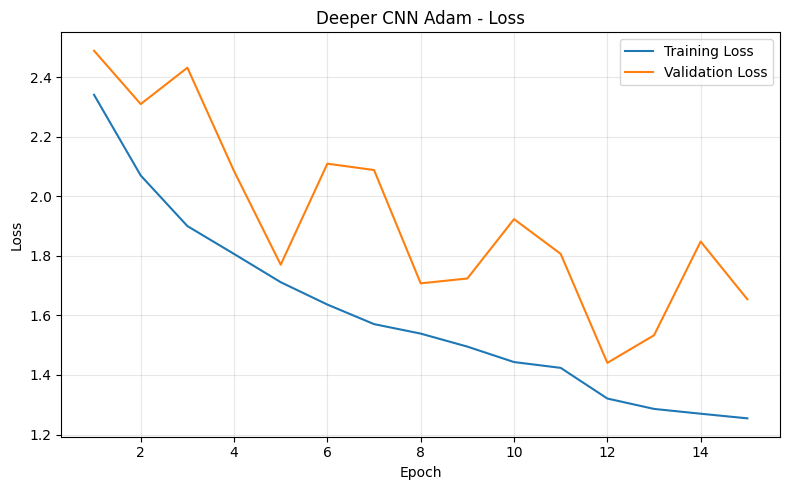

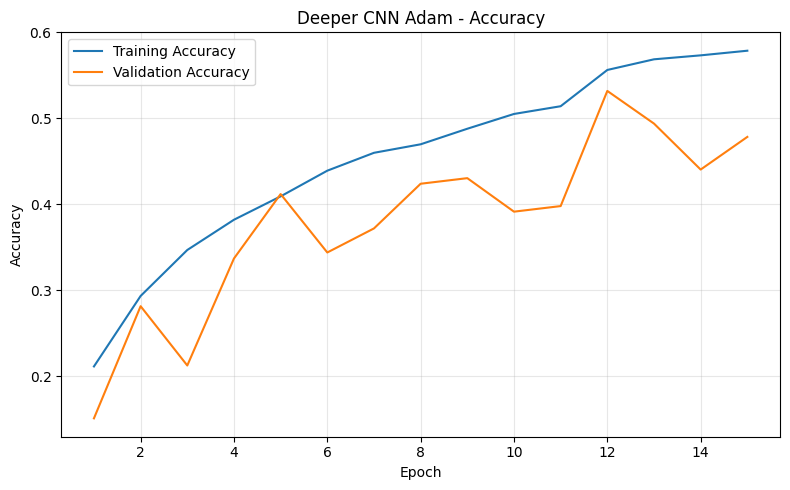


Deeper CNN Adam Results
Test Loss     : 1.6546
Test Accuracy : 0.4680
Precision     : 0.5896
Recall        : 0.4680
F1 Score      : 0.4416

Classification Report:
              precision    recall  f1-score   support

   butterfly       0.67      0.70      0.69       200
         cat       0.47      0.41      0.43       200
     chicken       0.31      0.69      0.43       200
         cow       0.65      0.12      0.20       200
         dog       0.70      0.08      0.14       200
    elephant       0.68      0.65      0.66       200
       horse       0.85      0.17      0.28       200
       sheep       0.55      0.38      0.45       200
      spider       0.75      0.68      0.71       200
    squirrel       0.29      0.81      0.43       200

    accuracy                           0.47      2000
   macro avg       0.59      0.47      0.44      2000
weighted avg       0.59      0.47      0.44      2000



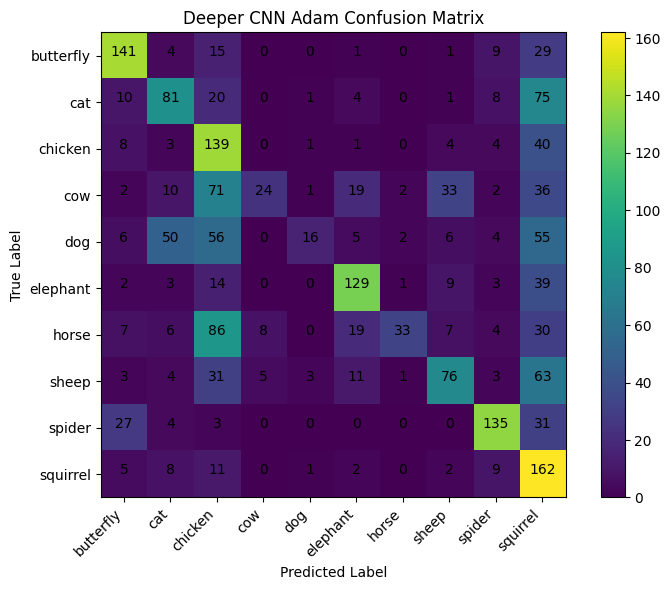

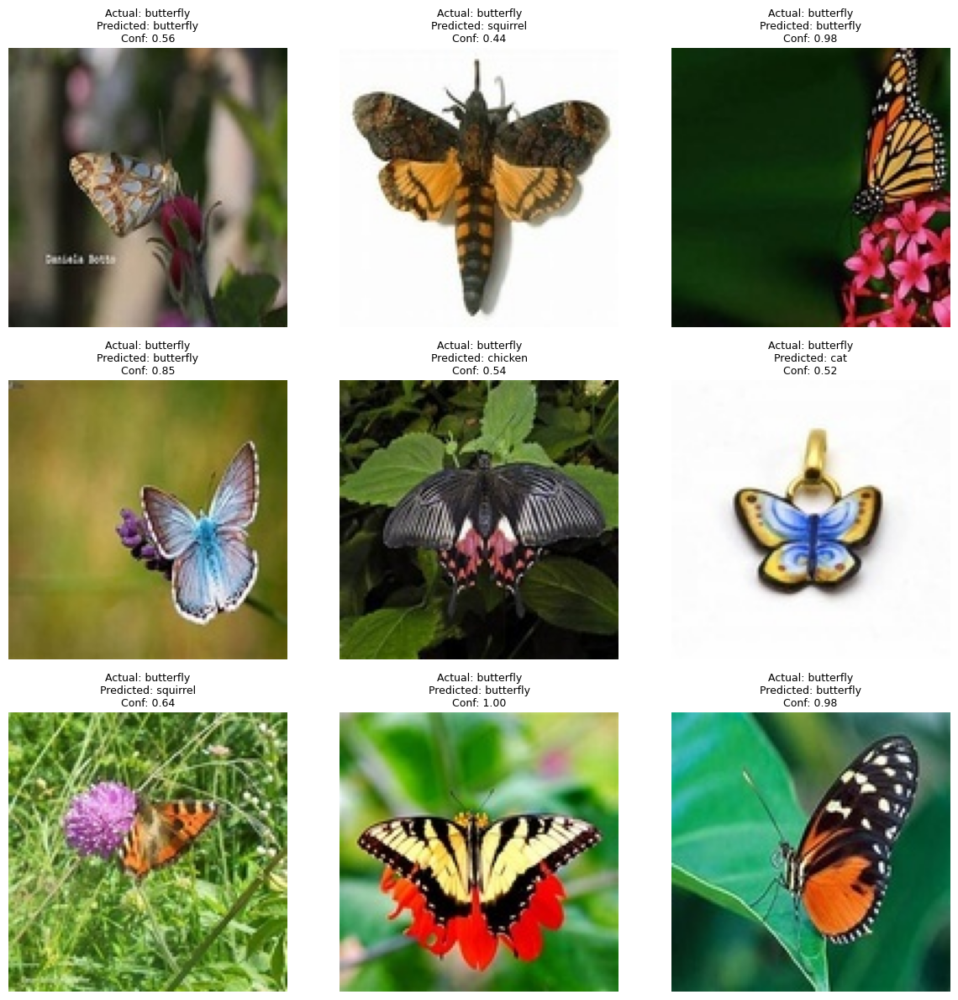

In [28]:
plot_history(history_deeper_adam, "Deeper CNN Adam", "deeper_adam")
res_deeper_adam = evaluate_model(deeper_adam, test_gen, "Deeper CNN Adam")
plot_confusion_matrix(res_deeper_adam["y_true"], res_deeper_adam["y_pred"],
                      "Deeper CNN Adam Confusion Matrix", "deeper_adam_confusion_matrix.png")
acc_da = res_deeper_adam["accuracy"]
plot_sample_predictions(
    deeper_adam,
    test_gen,
    CLASS_NAMES,
    n=9
)

In [14]:
deeper_sgd = build_deeper_cnn("sgd", (128,128,3), NUM_CLASSES)

cb_deeper_sgd = [
    callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=3, verbose=1),
    callbacks.ModelCheckpoint("best_deeper_sgd.keras", monitor="val_accuracy", save_best_only=True, verbose=0)
]

t0 = time.time()
history_deeper_sgd = deeper_sgd.fit(train_gen, epochs=EPOCHS_DEEPER,
                                    validation_data=val_gen, callbacks=cb_deeper_sgd, verbose=1)
deeper_sgd_time = time.time() - t0
print(f"Deeper SGD training time: {deeper_sgd_time/60:.2f} minutes")

Epoch 1/15
313/313 [==============================] - 72s 223ms/step - loss: 2.3619 - accuracy: 0.1997 - val_loss: 2.4267 - val_accuracy: 0.1265 - lr: 0.0010
Epoch 2/15
313/313 [==============================] - 94s 301ms/step - loss: 2.1331 - accuracy: 0.2677 - val_loss: 2.4998 - val_accuracy: 0.1935 - lr: 0.0010
Epoch 3/15
313/313 [==============================] - 78s 249ms/step - loss: 1.9789 - accuracy: 0.3160 - val_loss: 2.6012 - val_accuracy: 0.2140 - lr: 0.0010
Epoch 4/15
313/313 [==============================] - 75s 239ms/step - loss: 1.9062 - accuracy: 0.3365 - val_loss: 2.1935 - val_accuracy: 0.2620 - lr: 0.0010
Epoch 5/15
313/313 [==============================] - 80s 256ms/step - loss: 1.8246 - accuracy: 0.3673 - val_loss: 2.6944 - val_accuracy: 0.2275 - lr: 0.0010
Epoch 6/15
313/313 [==============================] - 78s 247ms/step - loss: 1.7590 - accuracy: 0.3861 - val_loss: 2.3061 - val_accuracy: 0.3110 - lr: 0.0010
Epoch 7/15
313/313 [==============================] 

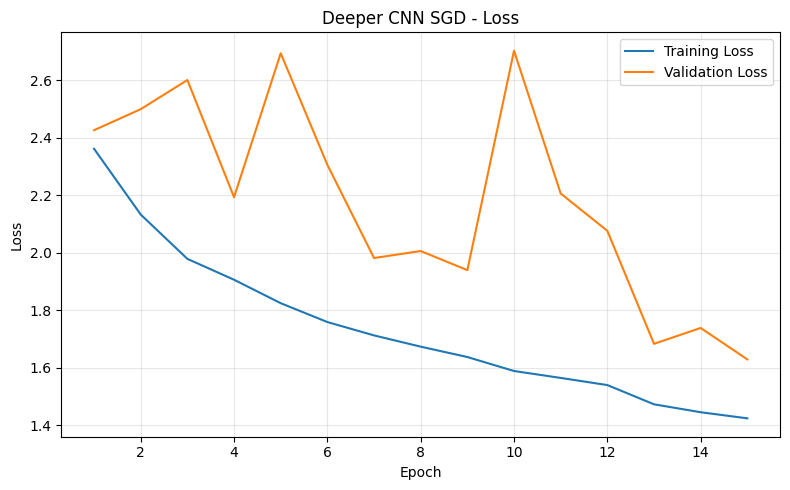

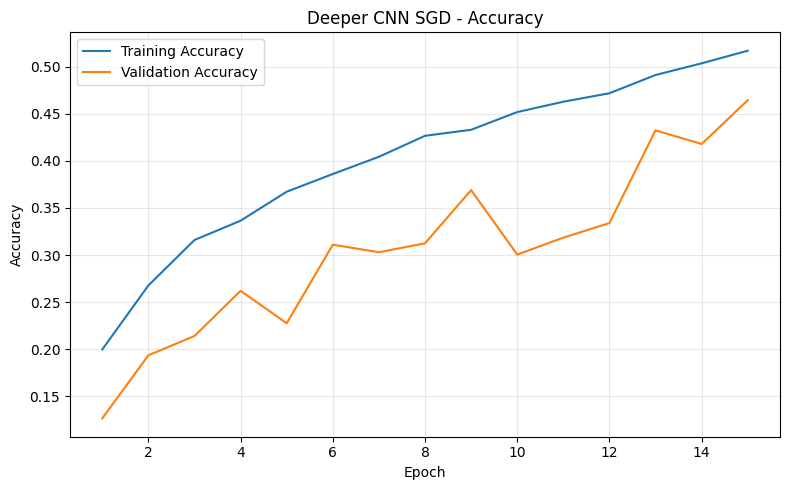


Deeper CNN SGD Results
Test Loss     : 1.6014
Test Accuracy : 0.4640
Precision     : 0.5112
Recall        : 0.4640
F1 Score      : 0.4477

Classification Report:
              precision    recall  f1-score   support

   butterfly       0.90      0.54      0.67       200
         cat       0.42      0.34      0.37       200
     chicken       0.52      0.58      0.55       200
         cow       0.57      0.25      0.35       200
         dog       0.59      0.22      0.32       200
    elephant       0.43      0.67      0.52       200
       horse       0.50      0.15      0.23       200
       sheep       0.31      0.57      0.40       200
      spider       0.53      0.82      0.65       200
    squirrel       0.35      0.50      0.41       200

    accuracy                           0.46      2000
   macro avg       0.51      0.46      0.45      2000
weighted avg       0.51      0.46      0.45      2000



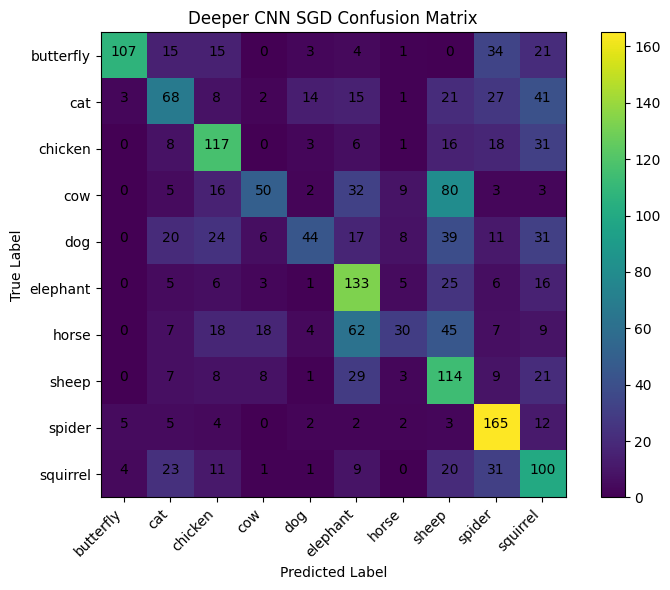

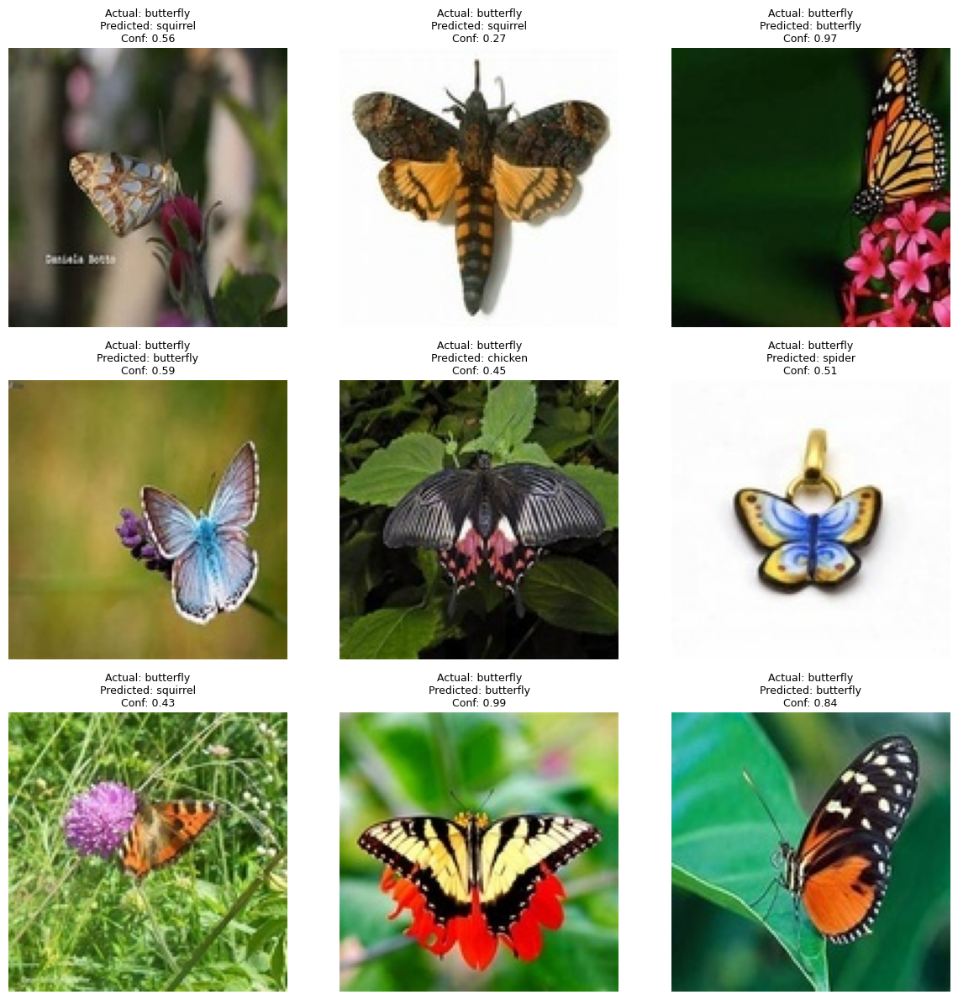

In [29]:
plot_history(history_deeper_sgd, "Deeper CNN SGD", "deeper_sgd")
res_deeper_sgd = evaluate_model(deeper_sgd, test_gen, "Deeper CNN SGD")
plot_confusion_matrix(res_deeper_sgd["y_true"], res_deeper_sgd["y_pred"],
                      "Deeper CNN SGD Confusion Matrix", "deeper_sgd_confusion_matrix.png")
acc_ds = res_deeper_sgd["accuracy"]
plot_sample_predictions(
    deeper_sgd,
    test_gen,
    CLASS_NAMES,
    n=9
)

## 4. Ablation Study — Remove Dropout

This checks whether Dropout improves generalization.

In [16]:
def build_deeper_no_dropout(input_shape=(128,128,3), num_classes=NUM_CLASSES):
    model = models.Sequential(name="deeper_no_dropout")

    l2_reg = keras.regularizers.l2(1e-4)

    for block_filters in [32, 64, 128]:
        if len(model.layers) == 0:
            model.add(layers.Conv2D(block_filters, (3,3), padding="same",
                                    input_shape=input_shape,
                                    kernel_regularizer=l2_reg))
        else:
            model.add(layers.Conv2D(block_filters, (3,3), padding="same",
                                    kernel_regularizer=l2_reg))

        model.add(layers.BatchNormalization())
        model.add(layers.Activation("relu"))

        model.add(layers.Conv2D(block_filters, (3,3), padding="same",
                                kernel_regularizer=l2_reg))
        model.add(layers.BatchNormalization())
        model.add(layers.Activation("relu"))

        model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.GlobalAveragePooling2D())

    model.add(layers.Dense(128, activation="relu", kernel_regularizer=l2_reg))
    model.add(layers.BatchNormalization())

    model.add(layers.Dense(num_classes, activation="softmax"))

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=3e-4),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model


ablation_model = build_deeper_no_dropout((128,128,3), NUM_CLASSES)
ablation_model.summary()

Model: "deeper_no_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 128, 128, 32)      896       
                                                                 
 batch_normalization_14 (Bat  (None, 128, 128, 32)     128       
 chNormalization)                                                
                                                                 
 activation_12 (Activation)  (None, 128, 128, 32)      0         
                                                                 
 conv2d_16 (Conv2D)          (None, 128, 128, 32)      9248      
                                                                 
 batch_normalization_15 (Bat  (None, 128, 128, 32)     128       
 chNormalization)                                                
                                                                 
 activation_13 (Activation)  (None, 128, 128, 32)

Epoch 1/15
313/313 [==============================] - 78s 248ms/step - loss: 1.0654 - accuracy: 0.6499 - val_loss: 2.1712 - val_accuracy: 0.3635
Epoch 2/15
313/313 [==============================] - 69s 220ms/step - loss: 1.0348 - accuracy: 0.6597 - val_loss: 2.0534 - val_accuracy: 0.4570
Epoch 3/15
313/313 [==============================] - 67s 215ms/step - loss: 1.0106 - accuracy: 0.6731 - val_loss: 1.7167 - val_accuracy: 0.4885
Epoch 4/15
313/313 [==============================] - 66s 209ms/step - loss: 0.9962 - accuracy: 0.6818 - val_loss: 1.7701 - val_accuracy: 0.5020
Epoch 5/15
313/313 [==============================] - 66s 211ms/step - loss: 0.9772 - accuracy: 0.6808 - val_loss: 1.8891 - val_accuracy: 0.5170
Epoch 6/15
313/313 [==============================] - 72s 230ms/step - loss: 0.9707 - accuracy: 0.6843 - val_loss: 1.7487 - val_accuracy: 0.4845
Epoch 7/15
313/313 [==============================] - 71s 227ms/step - loss: 0.9327 - accuracy: 0.7015 - val_loss: 1.7812 - val_ac

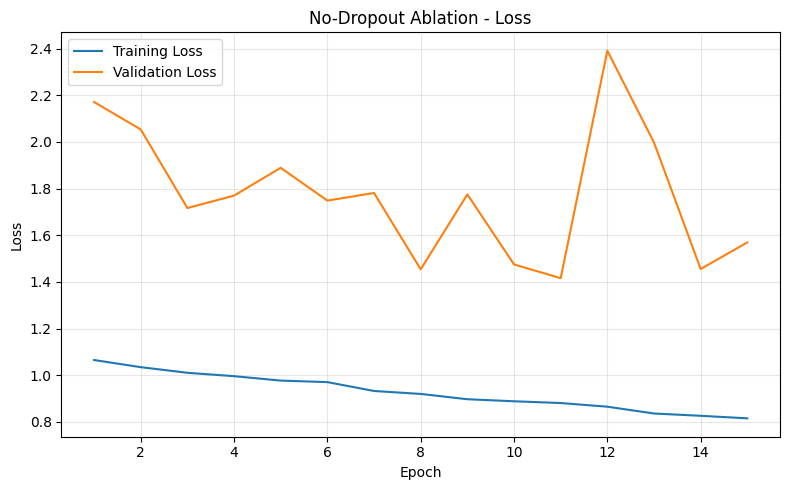

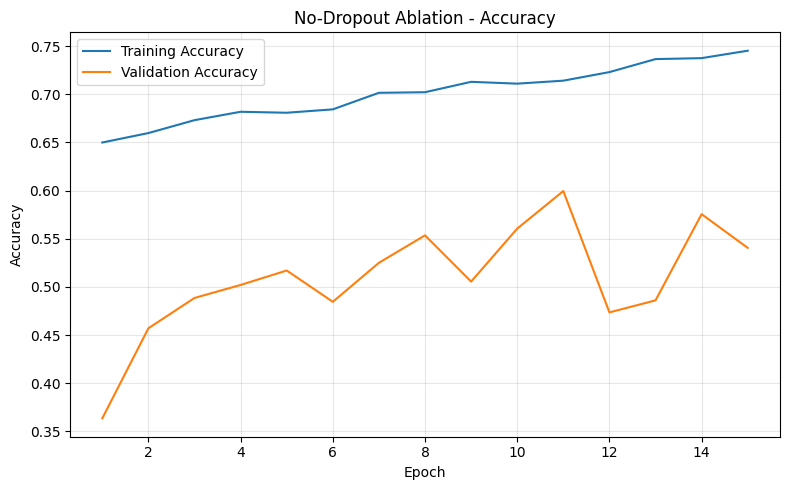


No-Dropout Ablation Results
Test Loss     : 1.4733
Test Accuracy : 0.5545
Precision     : 0.6756
Recall        : 0.5545
F1 Score      : 0.5493

Classification Report:
              precision    recall  f1-score   support

   butterfly       0.86      0.56      0.68       200
         cat       0.67      0.51      0.58       200
     chicken       0.31      0.91      0.46       200
         cow       0.52      0.59      0.55       200
         dog       0.81      0.14      0.25       200
    elephant       0.53      0.84      0.65       200
       horse       0.72      0.55      0.63       200
       sheep       0.62      0.65      0.63       200
      spider       0.95      0.52      0.67       200
    squirrel       0.77      0.27      0.40       200

    accuracy                           0.55      2000
   macro avg       0.68      0.55      0.55      2000
weighted avg       0.68      0.55      0.55      2000

Dropout effect compared with Deeper Adam: -0.0865


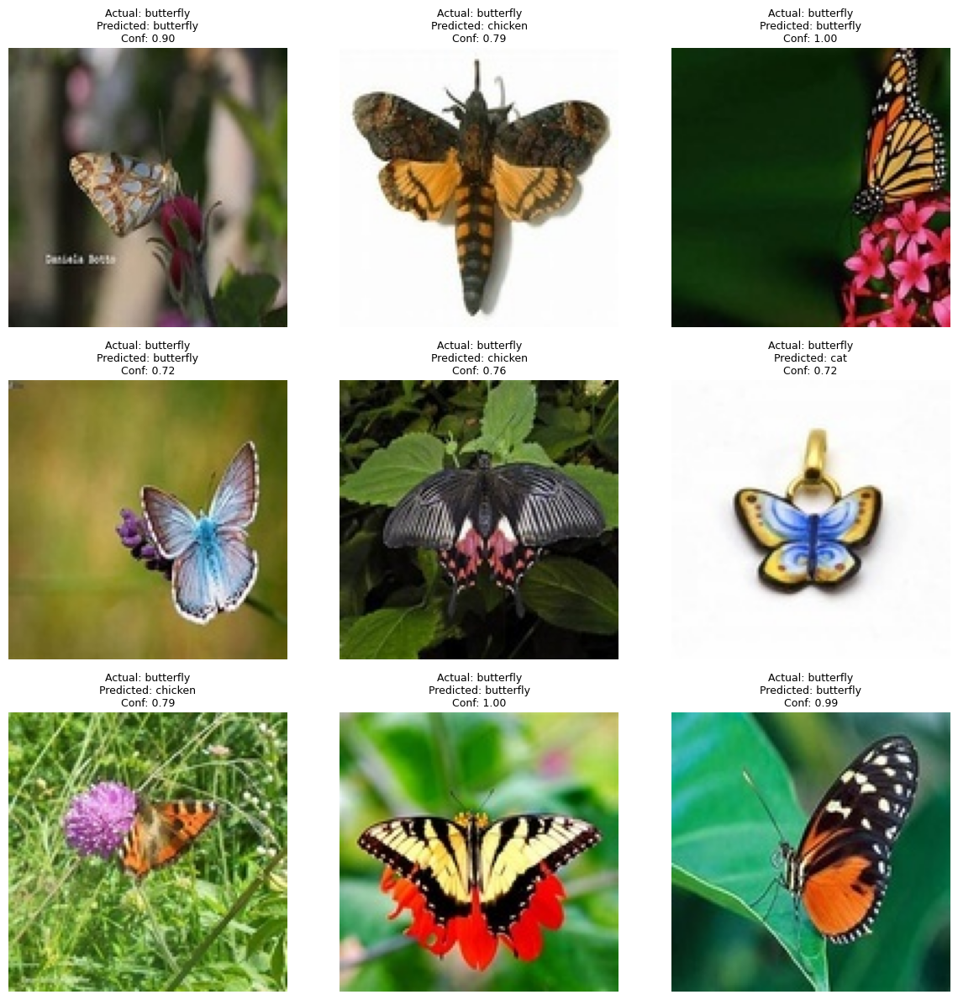

In [30]:
cb_ablation = [
    callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True, verbose=1),
    callbacks.ModelCheckpoint("best_no_dropout.keras", monitor="val_accuracy", save_best_only=True, verbose=0)
]

t0 = time.time()
history_ablation = ablation_model.fit(train_gen, epochs=EPOCHS_DEEPER,
                                      validation_data=val_gen, callbacks=cb_ablation, verbose=1)
ablation_time = time.time() - t0
print(f"No-Dropout training time: {ablation_time/60:.2f} minutes")

plot_history(history_ablation, "No-Dropout Ablation", "ablation")
res_ablation = evaluate_model(ablation_model, test_gen, "No-Dropout Ablation")
acc_ab = res_ablation["accuracy"]
print(f"Dropout effect compared with Deeper Adam: {acc_da - acc_ab:+.4f}")

plot_sample_predictions(
    ablation_model,
    test_gen,
    CLASS_NAMES,
    n=9
)

,Model,Accuracy,Precision,Recall,F1,Training Time (min)
0,Baseline Adam,0.5295,0.549336,0.5295,0.527311,13.798595
1,Deeper Adam,0.4680,0.589587,0.4680,0.441617,19.952190
2,Deeper SGD,0.4640,0.511250,0.4640,0.447723,19.932614
3,No Dropout,0.5545,0.675568,0.5545,0.549296,18.237936


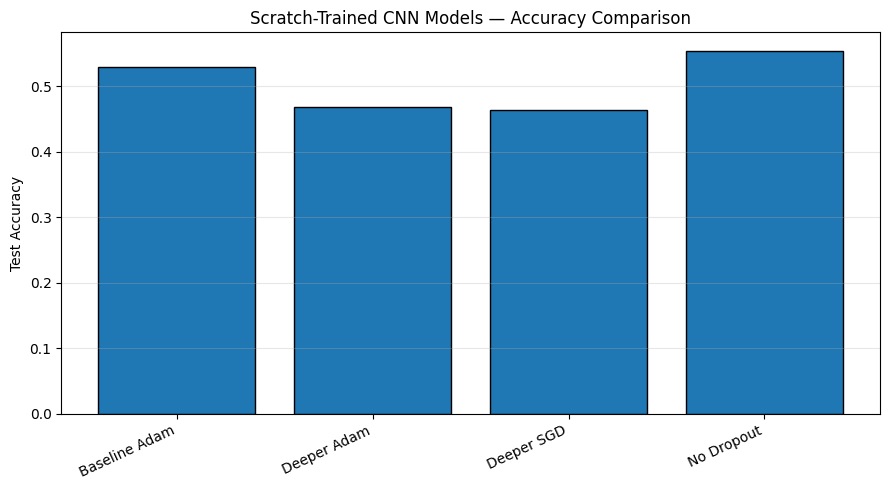

In [31]:
results_scratch = pd.DataFrame([
    {"Model": "Baseline Adam", "Accuracy": acc_b, "Precision": res_baseline["precision"], "Recall": res_baseline["recall"], "F1": res_baseline["f1"], "Training Time (min)": baseline_time/60},
    {"Model": "Deeper Adam", "Accuracy": acc_da, "Precision": res_deeper_adam["precision"], "Recall": res_deeper_adam["recall"], "F1": res_deeper_adam["f1"], "Training Time (min)": deeper_adam_time/60},
    {"Model": "Deeper SGD", "Accuracy": acc_ds, "Precision": res_deeper_sgd["precision"], "Recall": res_deeper_sgd["recall"], "F1": res_deeper_sgd["f1"], "Training Time (min)": deeper_sgd_time/60},
    {"Model": "No Dropout", "Accuracy": acc_ab, "Precision": res_ablation["precision"], "Recall": res_ablation["recall"], "F1": res_ablation["f1"], "Training Time (min)": ablation_time/60},
])
display(results_scratch)
results_scratch.to_csv("scratch_model_comparison.csv", index=False)

plt.figure(figsize=(9,5))
plt.bar(results_scratch["Model"], results_scratch["Accuracy"], edgecolor="black")
plt.xticks(rotation=25, ha="right")
plt.ylabel("Test Accuracy")
plt.title("Scratch-Trained CNN Models — Accuracy Comparison")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig("scratch_comparison.png", dpi=150, bbox_inches="tight")
plt.show()

## 5. Transfer Learning with MobileNetV2

MobileNetV2 is used because it is lighter and faster than VGG or ResNet, which is suitable for laptop GPU training.

In [19]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input

transfer_train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode="nearest"
)
transfer_eval_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

transfer_train_gen = transfer_train_datagen.flow_from_directory(DATA_DIR / "train", target_size=IMG_SIZE,
    batch_size=BATCH_SIZE, class_mode="categorical", shuffle=True, seed=SEED)
transfer_val_gen = transfer_eval_datagen.flow_from_directory(DATA_DIR / "val", target_size=IMG_SIZE,
    batch_size=BATCH_SIZE, class_mode="categorical", shuffle=False)
transfer_test_gen = transfer_eval_datagen.flow_from_directory(DATA_DIR / "test", target_size=IMG_SIZE,
    batch_size=BATCH_SIZE, class_mode="categorical", shuffle=False)

Found 10000 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [20]:
def build_transfer_model(input_shape=(128,128,3), num_classes=NUM_CLASSES):
    base_model = MobileNetV2(include_top=False, weights="imagenet", input_shape=input_shape)
    base_model.trainable = False

    inputs = keras.Input(shape=input_shape)
    x = base_model(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs, name="mobilenetv2_transfer")
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3),
                  loss="categorical_crossentropy", metrics=["accuracy"])
    return model

transfer_model = build_transfer_model((128,128,3), NUM_CLASSES)
transfer_model.summary()

Model: "mobilenetv2_transfer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 mobilenetv2_1.00_128 (Funct  (None, 4, 4, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_3   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_10 (Dense)            (None, 128)               163968    
                                                                 
 dropout_10 (Dropout)        (None, 128)               0         
                                                                 
 dense_11 (Dense)            (None, 10)       

In [21]:
cb_transfer = [
    callbacks.EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=2, verbose=1),
    callbacks.ModelCheckpoint("best_transfer_mobilenetv2.keras", monitor="val_accuracy", save_best_only=True, verbose=0)
]

t0 = time.time()
history_transfer = transfer_model.fit(transfer_train_gen, epochs=EPOCHS_TRANSFER,
                                      validation_data=transfer_val_gen, callbacks=cb_transfer, verbose=1)
transfer_time = time.time() - t0
print(f"Transfer learning training time: {transfer_time/60:.2f} minutes")

Epoch 1/8
313/313 [==============================] - 88s 266ms/step - loss: 0.6752 - accuracy: 0.7811 - val_loss: 0.3307 - val_accuracy: 0.8990 - lr: 0.0010
Epoch 2/8
313/313 [==============================] - 80s 255ms/step - loss: 0.4331 - accuracy: 0.8575 - val_loss: 0.3206 - val_accuracy: 0.8975 - lr: 0.0010
Epoch 3/8
313/313 [==============================] - 80s 254ms/step - loss: 0.3829 - accuracy: 0.8736 - val_loss: 0.3229 - val_accuracy: 0.8920 - lr: 0.0010
Epoch 4/8
313/313 [==============================] - 82s 261ms/step - loss: 0.3528 - accuracy: 0.8802 - val_loss: 0.3045 - val_accuracy: 0.9015 - lr: 0.0010
Epoch 5/8
313/313 [==============================] - 80s 257ms/step - loss: 0.3289 - accuracy: 0.8866 - val_loss: 0.2940 - val_accuracy: 0.9000 - lr: 0.0010
Epoch 6/8
313/313 [==============================] - 81s 258ms/step - loss: 0.3041 - accuracy: 0.8977 - val_loss: 0.3044 - val_accuracy: 0.8965 - lr: 0.0010
Epoch 7/8
313/313 [==============================] - 81s 2

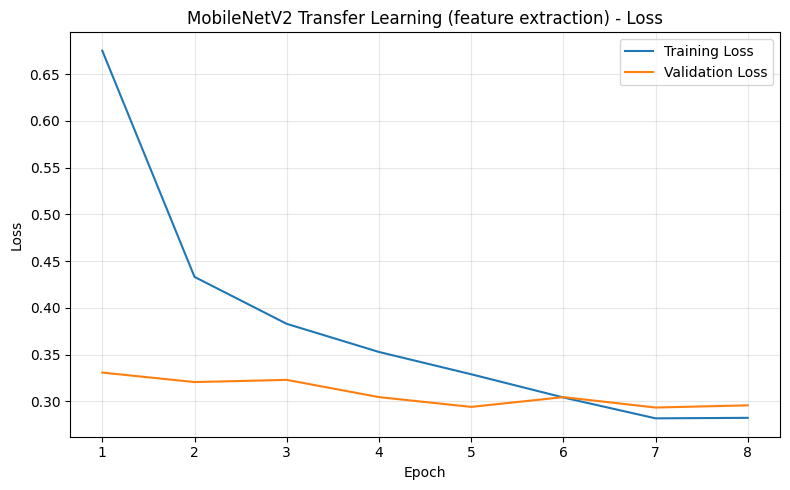

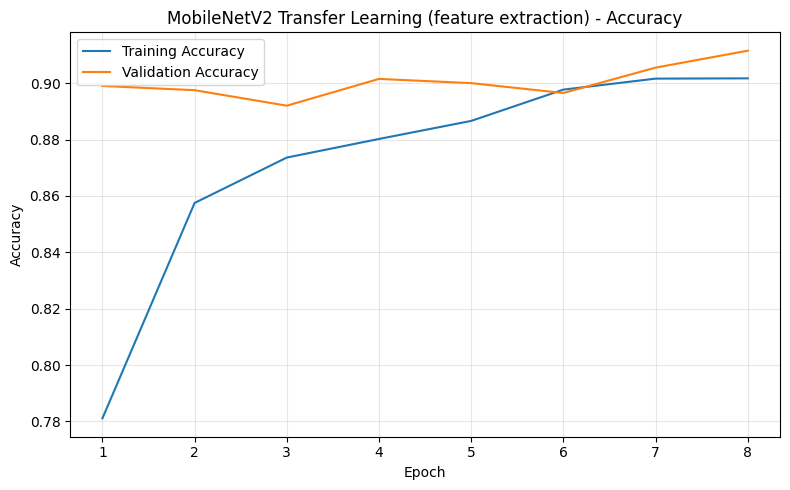


MobileNetV2 Transfer Learning Results
Test Loss     : 0.3062
Test Accuracy : 0.8995
Precision     : 0.9020
Recall        : 0.8995
F1 Score      : 0.8999

Classification Report:
              precision    recall  f1-score   support

   butterfly       0.91      0.94      0.93       200
         cat       0.94      0.84      0.89       200
     chicken       0.94      0.93      0.94       200
         cow       0.82      0.86      0.84       200
         dog       0.96      0.90      0.93       200
    elephant       0.88      0.94      0.91       200
       horse       0.92      0.85      0.89       200
       sheep       0.80      0.88      0.84       200
      spider       0.97      0.97      0.97       200
    squirrel       0.88      0.88      0.88       200

    accuracy                           0.90      2000
   macro avg       0.90      0.90      0.90      2000
weighted avg       0.90      0.90      0.90      2000



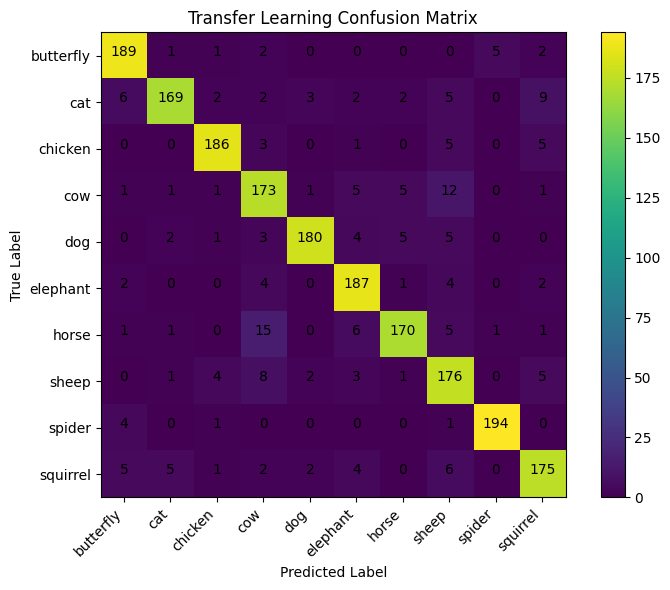

In [35]:
plot_history(history_transfer, "MobileNetV2 Transfer Learning (feature extraction)", "transfer")
res_transfer = evaluate_model(transfer_model, transfer_test_gen, "MobileNetV2 Transfer Learning")
plot_confusion_matrix(res_transfer["y_true"], res_transfer["y_pred"],
                      "Transfer Learning Confusion Matrix", "transfer_confusion_matrix.png")
acc_tl = res_transfer["accuracy"]

,Model,Accuracy,Training Time (min)
0,Baseline Adam,0.5295,13.798595
1,Deeper Adam,0.4680,19.952190
2,Deeper SGD,0.4640,19.932614
3,No Dropout,0.4510,20.857885
4,Transfer Learning MobileNetV2,0.8995,11.002573


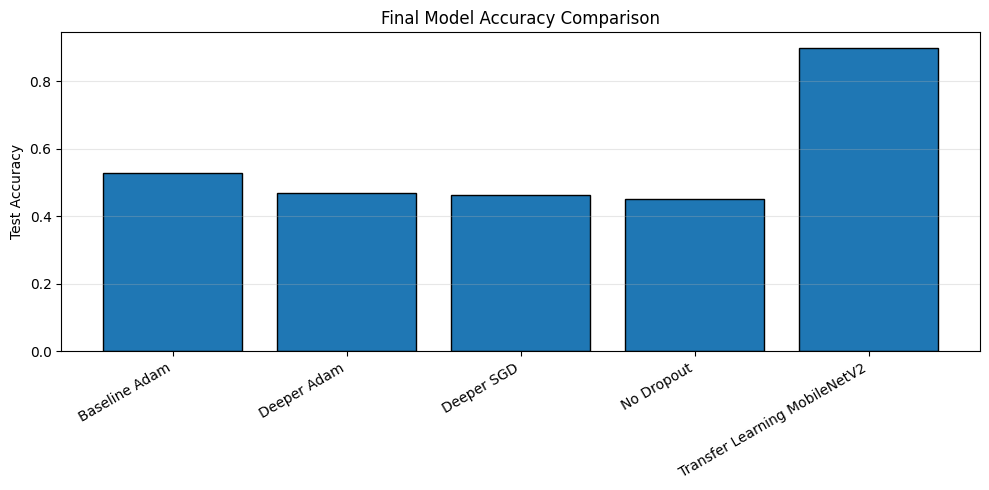

In [23]:
final_results = pd.DataFrame([
    {"Model": "Baseline Adam", "Accuracy": acc_b, "Training Time (min)": baseline_time/60},
    {"Model": "Deeper Adam", "Accuracy": acc_da, "Training Time (min)": deeper_adam_time/60},
    {"Model": "Deeper SGD", "Accuracy": acc_ds, "Training Time (min)": deeper_sgd_time/60},
    {"Model": "No Dropout", "Accuracy": acc_ab, "Training Time (min)": ablation_time/60},
    {"Model": "Transfer Learning MobileNetV2", "Accuracy": acc_tl, "Training Time (min)": transfer_time/60},
])
display(final_results)
final_results.to_csv("final_model_comparison.csv", index=False)

plt.figure(figsize=(10,5))
plt.bar(final_results["Model"], final_results["Accuracy"], edgecolor="black")
plt.xticks(rotation=30, ha="right")
plt.ylabel("Test Accuracy")
plt.title("Final Model Accuracy Comparison")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig("final_model_comparison.png", dpi=150, bbox_inches="tight")
plt.show()

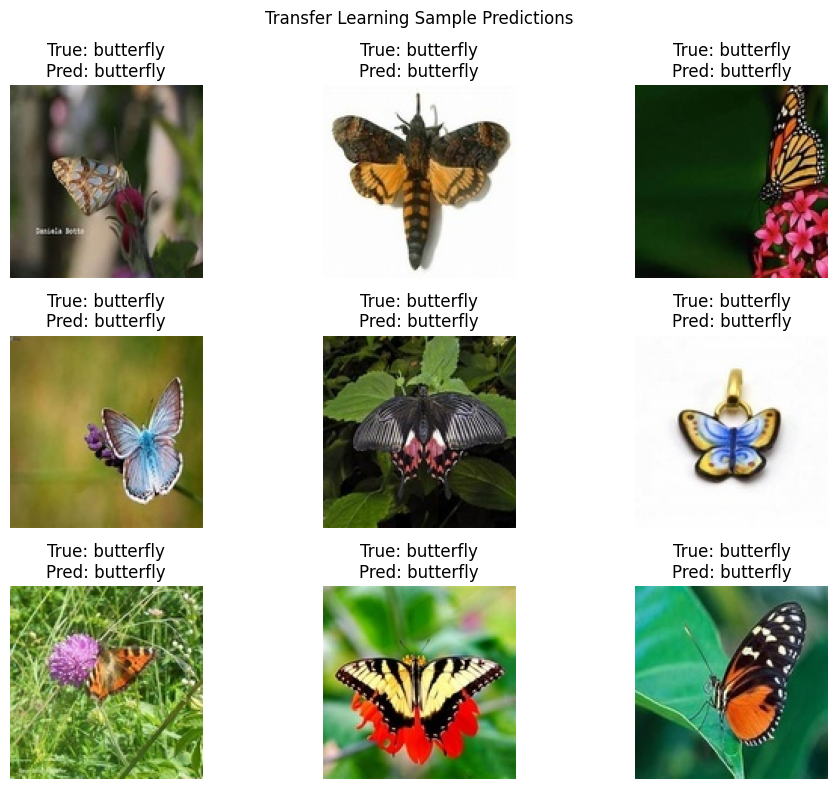

In [24]:
def show_sample_predictions(model, generator, title="Sample Predictions", n=9):
    generator.reset()
    images, labels = next(generator)
    probs = model.predict(images, verbose=0)
    preds = np.argmax(probs, axis=1)
    true = np.argmax(labels, axis=1)

    plt.figure(figsize=(10,8))
    for i in range(min(n, len(images))):
        plt.subplot(3,3,i+1)
        img = images[i]
        if img.min() < 0:
            img = (img + 1) / 2
        plt.imshow(np.clip(img, 0, 1))
        plt.title(f"True: {CLASS_NAMES[true[i]]}\nPred: {CLASS_NAMES[preds[i]]}")
        plt.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.savefig("sample_predictions.png", dpi=150, bbox_inches="tight")
    plt.show()

show_sample_predictions(transfer_model, transfer_test_gen, "Transfer Learning Sample Predictions")

In [36]:
# ── Phase 2: Fine Tuning MobileNetV2 ────────────────────────────────────

# Unfreeze the base MobileNetV2 model
base_model = transfer_model.get_layer("mobilenetv2_1.00_128")
base_model.trainable = True

# Keep earlier layers frozen and only fine-tune the last layers
# This trains deeper image features without destroying the pretrained weights
fine_tune_at = 100

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Recompile with a very small learning rate for fine tuning
# Small LR is important because pretrained weights should change slowly
transfer_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

cb_finetune = [
    callbacks.EarlyStopping(
        monitor="val_loss",
        patience=4,
        restore_best_weights=True,
        verbose=1
    ),
    callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.3,
        patience=2,
        verbose=1
    ),
    callbacks.ModelCheckpoint(
        "best_transfer_mobilenetv2_finetuned.keras",
        monitor="val_accuracy",
        save_best_only=True,
        verbose=0
    )
]

t0 = time.time()

history_finetune = transfer_model.fit(
    transfer_train_gen,
    epochs=10,
    validation_data=transfer_val_gen,
    callbacks=cb_finetune,
    verbose=1
)

finetune_time = time.time() - t0

print(f"Fine tuning training time: {finetune_time/60:.2f} minutes")

Epoch 1/10
313/313 [==============================] - 152s 452ms/step - loss: 0.2464 - accuracy: 0.9156 - val_loss: 0.2848 - val_accuracy: 0.9110 - lr: 1.0000e-05
Epoch 2/10
313/313 [==============================] - 125s 398ms/step - loss: 0.2209 - accuracy: 0.9234 - val_loss: 0.2850 - val_accuracy: 0.9120 - lr: 1.0000e-05
Epoch 3/10
313/313 [==============================] - 133s 425ms/step - loss: 0.1956 - accuracy: 0.9310 - val_loss: 0.2743 - val_accuracy: 0.9165 - lr: 1.0000e-05
Epoch 4/10
313/313 [==============================] - 134s 428ms/step - loss: 0.1942 - accuracy: 0.9330 - val_loss: 0.2857 - val_accuracy: 0.9150 - lr: 1.0000e-05
Epoch 5/10
313/313 [==============================] - ETA: 0s - loss: 0.1715 - accuracy: 0.9366
Epoch 5: ReduceLROnPlateau reducing learning rate to 2.9999999242136253e-06.
313/313 [==============================] - 138s 440ms/step - loss: 0.1715 - accuracy: 0.9366 - val_loss: 0.2798 - val_accuracy: 0.9200 - lr: 1.0000e-05
Epoch 6/10
313/313 [===

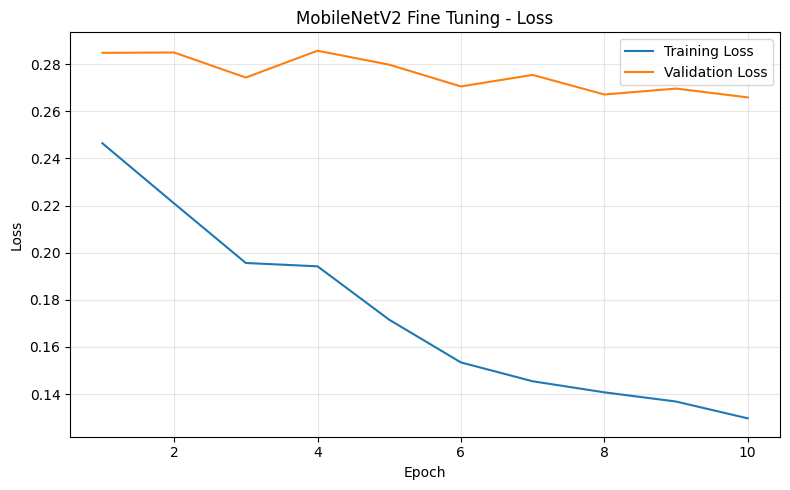

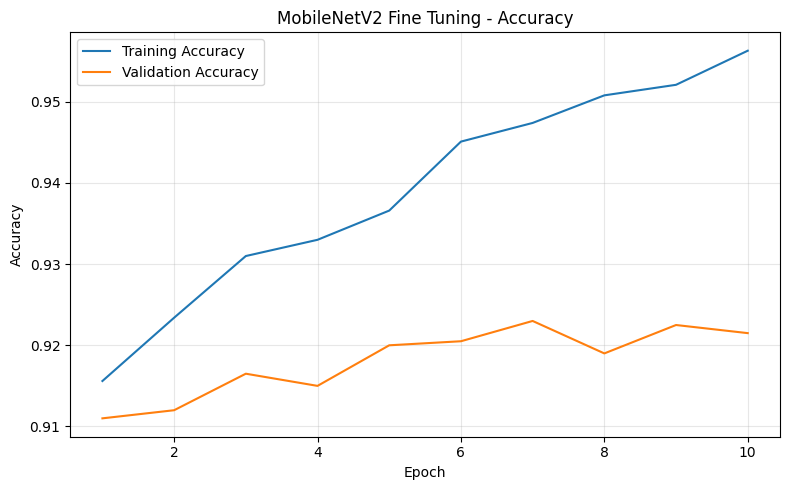


Fine Tuned MobileNetV2 Results
Test Loss     : 0.2737
Test Accuracy : 0.9175
Precision     : 0.9184
Recall        : 0.9175
F1 Score      : 0.9178

Classification Report:
              precision    recall  f1-score   support

   butterfly       0.95      0.95      0.95       200
         cat       0.93      0.90      0.91       200
     chicken       0.94      0.93      0.93       200
         cow       0.84      0.90      0.87       200
         dog       0.96      0.93      0.94       200
    elephant       0.93      0.93      0.93       200
       horse       0.92      0.91      0.92       200
       sheep       0.84      0.85      0.85       200
      spider       0.98      0.98      0.98       200
    squirrel       0.89      0.90      0.89       200

    accuracy                           0.92      2000
   macro avg       0.92      0.92      0.92      2000
weighted avg       0.92      0.92      0.92      2000



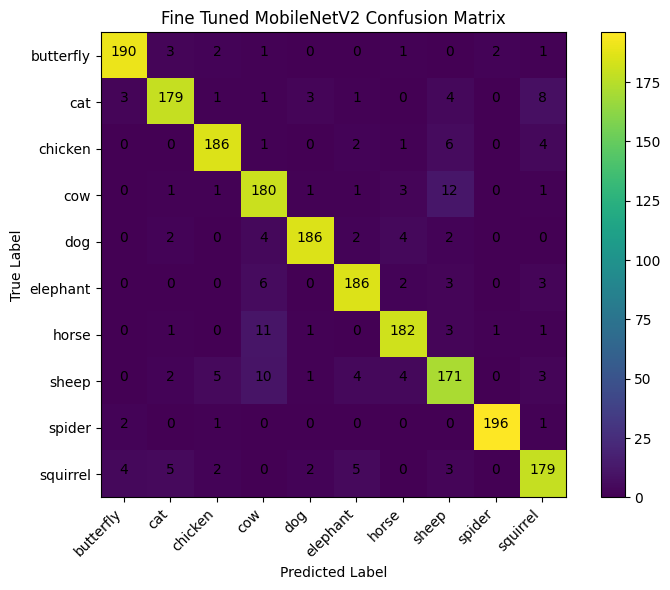

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


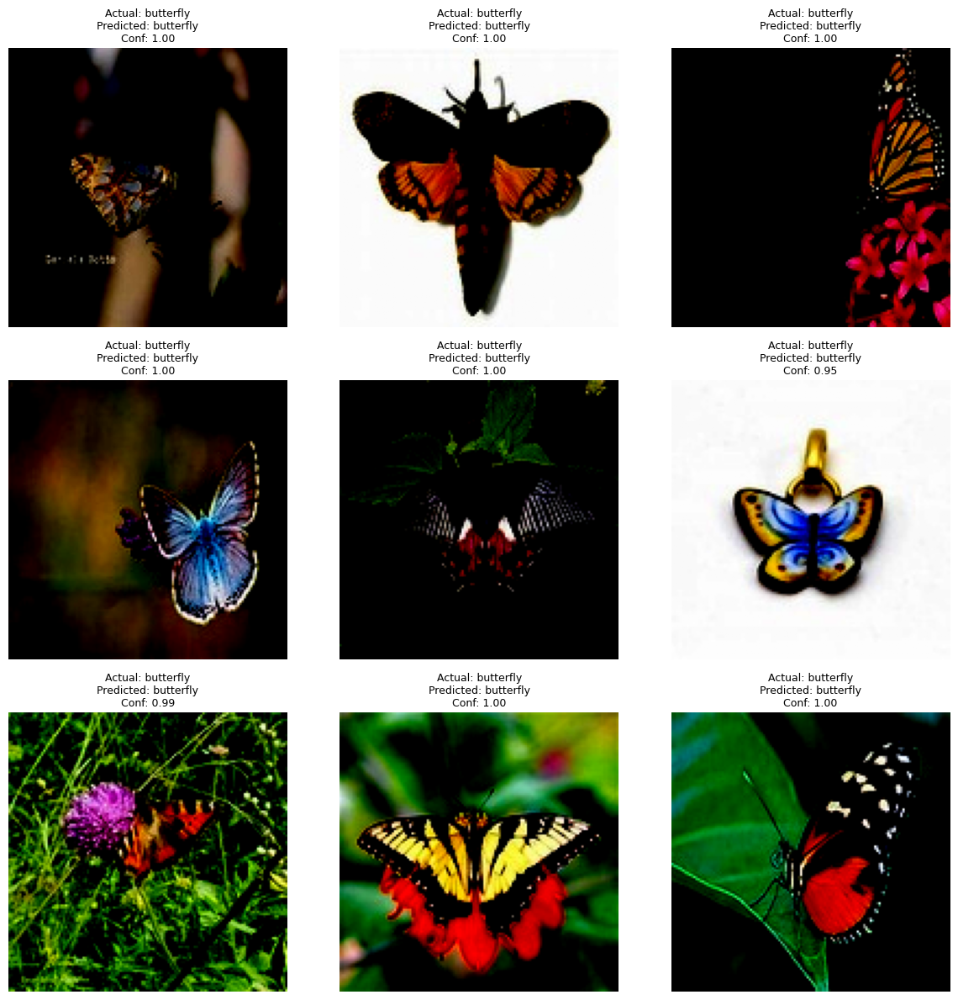

In [37]:
# ── Fine Tuned MobileNetV2 Evaluation and Plots ──────────────────────────

# Plot loss and accuracy from fine tuning history
plot_history(
    history_finetune,
    title="MobileNetV2 Fine Tuning",
    filename_prefix="mobilenetv2_finetune"
)

# Evaluate fine tuned model on test set
finetune_results = evaluate_model(
    transfer_model,
    transfer_test_gen,
    model_name="Fine Tuned MobileNetV2"
)

# Plot confusion matrix
plot_confusion_matrix(
    finetune_results["y_true"],
    finetune_results["y_pred"],
    title="Fine Tuned MobileNetV2 Confusion Matrix",
    filename="mobilenetv2_finetune_confusion_matrix.png"
)

# Plot sample predictions
plot_sample_predictions(
    transfer_model,
    transfer_test_gen,
    CLASS_NAMES,
    n=9
)

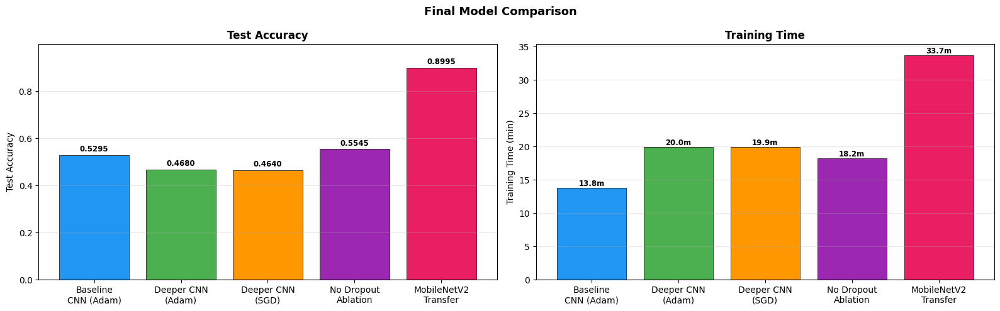

In [38]:
# ── Final 5-model comparison ─────────────────────────────────────────────

# Make sure MobileNetV2 metrics exist if this cell is run directly.
# If fine-tuning was completed, use the fine-tuned result.
# Otherwise, use the Phase 1 transfer result.

if 'res_transfer_finetuned' in globals():
    acc_tl = res_transfer_finetuned["accuracy"]
elif 'res_transfer' in globals():
    acc_tl = res_transfer["accuracy"]
else:
    loss_tl, acc_tl = transfer_model.evaluate(transfer_test_gen, verbose=0)

# Make sure transfer time exists.
# If fine-tuning was done, total time = Phase 1 + Phase 2.
if 'finetune_time' in globals():
    transfer_total_time = transfer_time + finetune_time
else:
    transfer_total_time = transfer_time

all_models = [
    'Baseline\nCNN (Adam)',
    'Deeper CNN\n(Adam)',
    'Deeper CNN\n(SGD)',
    'No Dropout\nAblation',
    'MobileNetV2\nTransfer'
]

all_accs = [
    acc_b,
    acc_da,
    acc_ds,
    acc_ab,
    acc_tl
]

all_times = [
    baseline_time / 60,
    deeper_adam_time / 60,
    deeper_sgd_time / 60,
    ablation_time / 60,
    transfer_total_time / 60
]

colors5 = ['#2196F3', '#4CAF50', '#FF9800', '#9C27B0', '#E91E63']

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Accuracy chart
bars = axes[0].bar(
    all_models,
    all_accs,
    color=colors5,
    edgecolor='black',
    linewidth=0.5
)

axes[0].set_ylim(0, min(1.0, max(all_accs) + 0.10))
axes[0].set_ylabel('Test Accuracy')
axes[0].set_title('Test Accuracy', fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

for b, v in zip(bars, all_accs):
    axes[0].text(
        b.get_x() + b.get_width() / 2,
        b.get_height() + 0.015,
        f'{v:.4f}',
        ha='center',
        fontsize=8.5,
        fontweight='bold'
    )

# Training time chart
bars2 = axes[1].bar(
    all_models,
    all_times,
    color=colors5,
    edgecolor='black',
    linewidth=0.5
)

axes[1].set_ylabel('Training Time (min)')
axes[1].set_title('Training Time', fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

for b, v in zip(bars2, all_times):
    axes[1].text(
        b.get_x() + b.get_width() / 2,
        b.get_height() + 0.3,
        f'{v:.1f}m',
        ha='center',
        fontsize=8.5,
        fontweight='bold'
    )

plt.suptitle('Final Model Comparison', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('final_model_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## Short Report Notes

- Images are resized to `128 × 128` to reduce computation and GPU memory use.
- The baseline CNN uses 3 convolutional layers, 3 pooling layers, 3 fully connected layers, and a softmax output layer.
- The deeper CNN has double the convolutional depth and uses Batch Normalization and Dropout.
- GlobalAveragePooling2D reduces parameters compared with a large Flatten layer.
- Adam and SGD are compared to study optimizer effect.
- The ablation model removes Dropout to test the effect of regularization.
- Transfer learning uses MobileNetV2 because it is lightweight and suitable for laptop GPU training.